In [1]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# 1. Load Audio

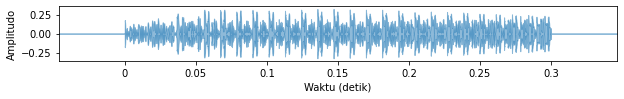

Signal shape: (6615,)
Sample Rate: 22050


In [2]:
# Load audio with sample rate 22050 Hz
AUDIO_PATH = '../data/wav_split/1/normal/normal_2_1.wav'
signal, sr = librosa.load(AUDIO_PATH, duration=0.3)

plt.figure(figsize=(10, 1))
sg = np.append(np.zeros([1,1024]), signal)
sg = np.append(sg, np.zeros([1,1024]))
librosa.display.waveplot(sg, sr=sr, alpha=0.5, offset=-1024/sr)
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()
# plt.savefig('wave.jpg', bbox_inches='tight')

print('Signal shape:', signal.shape)
print('Sample Rate:', sr)

# 2. Framing and Windoing

### Pad the signal so that frames are centered 

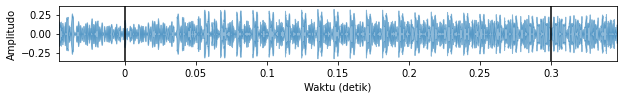

In [3]:
n_fft = 2048
win_length = n_fft

y = np.pad(signal, int(n_fft // 2), mode='reflect')

plt.figure(figsize=(10, 1))
librosa.display.waveplot(y, sr=sr, alpha=0.5, offset=-1024/sr)
plt.axvline(0, c='black')
plt.axvline(0.3, c='black')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()
# plt.savefig('padded_wave.jpg', bbox_inches='tight')

### Segment signal to some frame

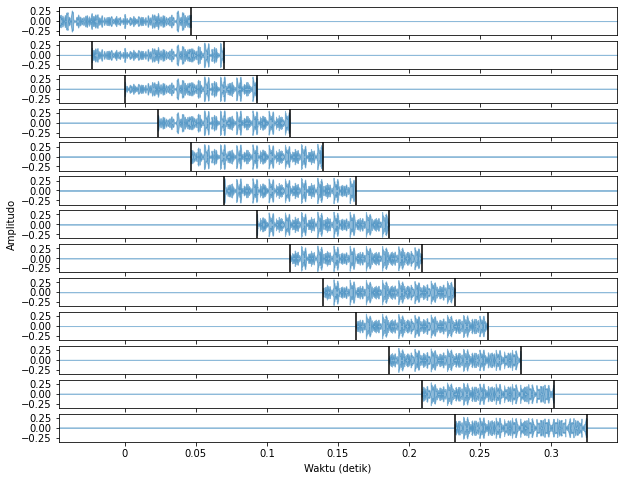

In [4]:
hop_length = 512

y_frames = librosa.util.frame(y, frame_length=n_fft, hop_length=hop_length)
y_frames.shape

fig, ax = plt.subplots(nrows=13, sharex=True, sharey=True, figsize=(10,8))

for i in range(13):
    frame = np.zeros([1,hop_length*i])
    frame = np.append(frame, y_frames[:,i])
    frame = np.append(frame, np.zeros([1,6615+2048-frame.shape[0]]))
    img = librosa.display.waveplot(frame, ax=ax[i], alpha=0.5, offset=-1024/sr)
    ax[i].set(xlabel=None)
    ax[i].axvline(512*i/sr-1024/sr, c='black')
    ax[i].axvline(512*i/sr-1024/sr+2048/sr, c='black')
ax[i].set(xlabel='Waktu (detik)')
ax[6].set(ylabel='Amplitudo')
plt.show()
# plt.savefig('segmented_wave.jpg', bbox_inches='tight')

### Create hanning window

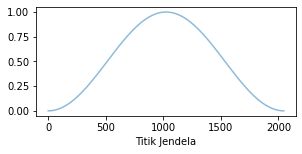

In [5]:
import scipy.signal

window = 'hann'

fft_window = scipy.signal.get_window(window, win_length, fftbins=True)
fft_window = librosa.util.pad_center(fft_window, n_fft)
fft_window_transpose = fft_window.reshape((-1, 1))

plt.figure(figsize=(15*(win_length/signal.shape[0]), 2))
plt.plot(range(win_length),fft_window, alpha=0.5)
plt.xlabel('Titik Jendela')
plt.show()
# plt.savefig('hann_window_new.jpg', bbox_inches='tight')

### Perform windowing

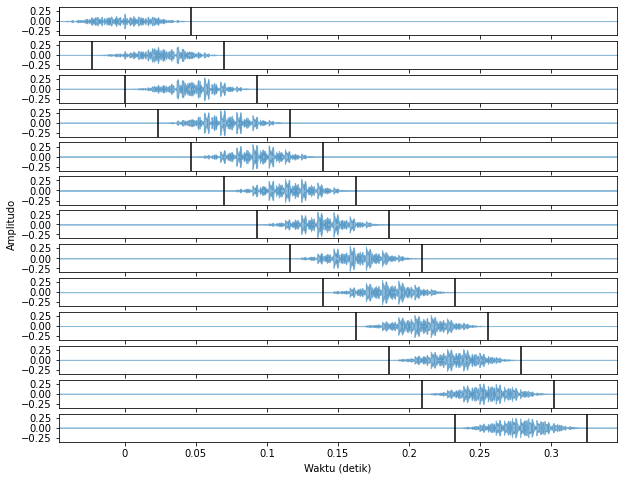

In [6]:
y_frames_windowed = fft_window_transpose * y_frames

fig, ax = plt.subplots(nrows=13, sharex=True, sharey=True, figsize=(10,8))

for i in range(13):
    frame = np.zeros([1,hop_length*i])
    frame = np.append(frame, y_frames_windowed[:,i])
    frame = np.append(frame, np.zeros([1,6615+2048-frame.shape[0]]))
    img = librosa.display.waveplot(frame, ax=ax[i], alpha=0.5, offset=-1024/sr)
    ax[i].set(xlabel=None)
    ax[i].axvline(512*i/sr-1024/sr, c='black')
    ax[i].axvline(512*i/sr-1024/sr+2048/sr, c='black')
ax[i].set(xlabel='Waktu (detik)')
ax[6].set(ylabel='Amplitudo')
plt.show()
# plt.savefig('windowed_frame.jpg', bbox_inches='tight')

# 3. STFT (DFT Each Frame)

### Pre-allocate the STFT matrix

In [7]:
dtype = librosa.util.dtype_r2c(y.dtype)
stft_matrix = np.empty((int(1 + n_fft // 2), y_frames.shape[1]), dtype=dtype, order="F")
# how many columns can we fit within MAX_MEM_BLOCK?
n_columns = librosa.util.MAX_MEM_BLOCK // (stft_matrix.shape[0] * stft_matrix.itemsize)
n_columns = max(n_columns, 1)
stft_matrix.shape

(1025, 13)

### Calculate fft for each frame

In [8]:
import numpy.fft
for bl_s in range(0, stft_matrix.shape[1], n_columns):
    bl_t = min(bl_s + n_columns, stft_matrix.shape[1])

    stft_matrix[:, bl_s:bl_t] = numpy.fft.rfft(fft_window_transpose * y_frames[:, bl_s:bl_t], axis=0)

### See result fft for first frame

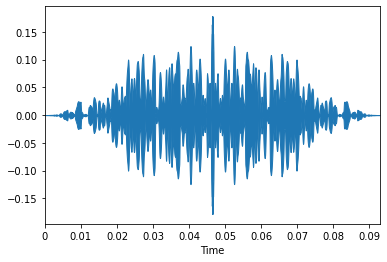

In [9]:
librosa.display.waveplot(y_frames_windowed[:,0])
plt.show()

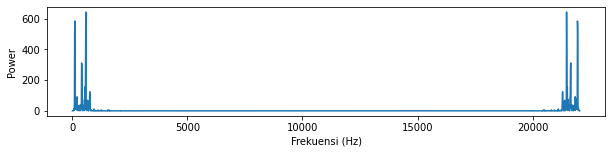

In [10]:
test_fft = np.fft.fft(y_frames_windowed[:,0])
magnitude = np.abs(test_fft)**2
frequency = np.linspace(0, sr, len(magnitude))

plt.figure(figsize=(10,2))
plt.plot(frequency, magnitude)
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Power')
plt.show()
# plt.savefig('power_spectrum.png', bbox_inches='tight')

### Half of fft spectrum

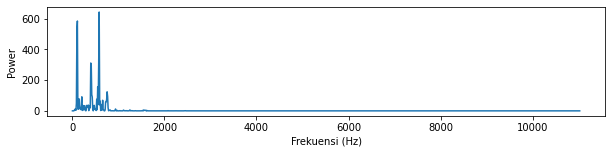

In [11]:
test_fft = np.fft.rfft(y_frames_windowed[:,0])
magnitude = np.abs(test_fft)**2
frequency = librosa.fft_frequencies(sr, n_fft)

plt.figure(figsize=(10,2))
plt.plot(frequency, magnitude)
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Power')
plt.show()
# plt.savefig('half_power_spectrum.png', bbox_inches='tight')

# 4. Mel Frekuensi Filtering

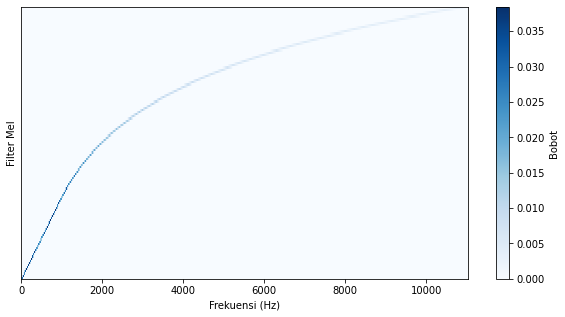

In [12]:
mel_basis = librosa.filters.mel(sr, n_fft)

fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(mel_basis, x_axis='linear', ax=ax, cmap='Blues')
ax.set(ylabel='Filter Mel', xlabel='Frekuensi (Hz)')
fig.colorbar(img, ax=ax, label='Bobot')
plt.show()
# plt.savefig('mel filter bank.jpg', bbox_inches='tight')

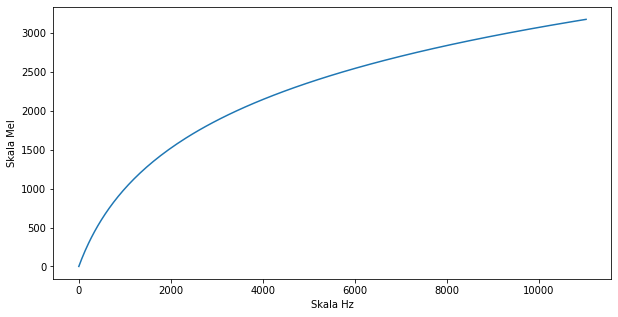

In [13]:
high_mel = 2595 * np.log10(1 + 11025/700)
mel_point = np.linspace(0, high_mel, 128)
hz_point = 700 * (10**(mel_point/2595)-1)
plt.figure(figsize=(10,5))
plt.plot(hz_point, mel_point)
plt.xlabel('Skala Hz')
plt.ylabel('Skala Mel')
plt.show()

/home/hilmi/anaconda3/envs/GOA-SVM-for-GPT-Classification/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/hilmi/anaconda3/envs/GOA-SVM-for-GPT-Classification/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/hilmi/anaconda3/envs/GOA-SVM-for-GPT-Classification/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


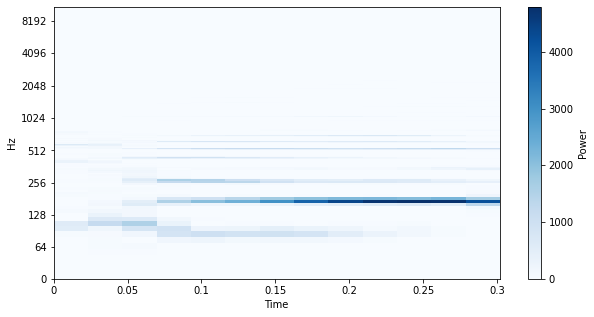

In [14]:
D = np.abs(stft_matrix)**2

fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(D, y_axis='log', x_axis='time', ax=ax, cmap='Blues')
fig.colorbar(img, ax=ax, label='Power')
plt.show()

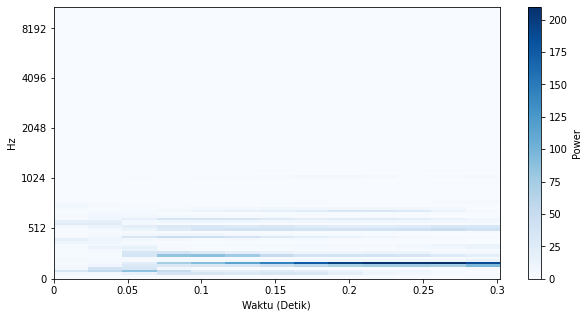

In [15]:
S = np.dot(mel_basis, D)

fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S, x_axis='time', y_axis='mel', sr=sr, ax=ax, cmap='Blues')
fig.colorbar(img, ax=ax, label='Power')
ax.set(xlabel='Waktu (Detik)')
plt.savefig('melspektrogram.jpg', bbox_inches='tight')

# 5. Convert Power to dB (Log-Power)

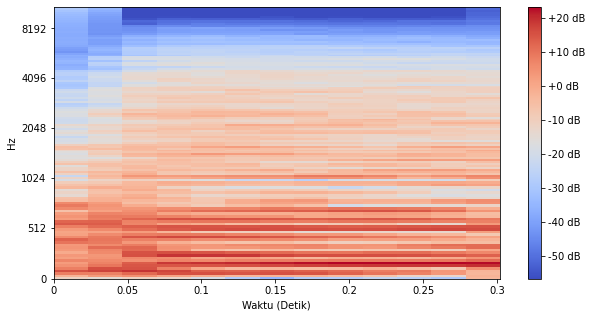

In [16]:
S_db = librosa.power_to_db(S)

fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(S_db, x_axis='time', y_axis='mel', sr=sr, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(xlabel='Waktu (Detik)')
plt.savefig('melspektrogram_db.jpg', bbox_inches='tight')

# 6. Perform DCT and Take First 13 Coeffs

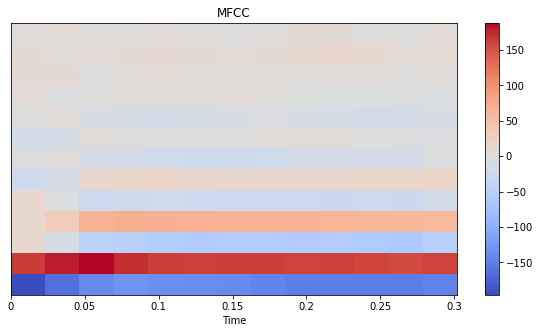

In [17]:
import scipy.fftpack
dct_type=2
norm='ortho'
n_mfcc=13

M = scipy.fftpack.dct(S_db, axis=0, type=dct_type, norm=norm)
mfcc = M[:n_mfcc]

fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(mfcc, x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC-13')
plt.show()

# 7. MFCC Dynamic Features ($\Delta$ MFCC & $\Delta^2$ MFCC)

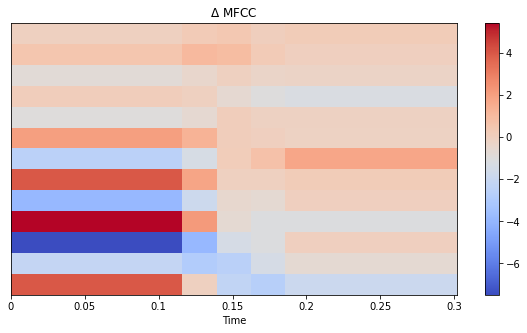

In [18]:
delta_mfcc = librosa.feature.delta(mfcc)

fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(delta_mfcc, x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='$\Delta$ MFCC')
plt.show()

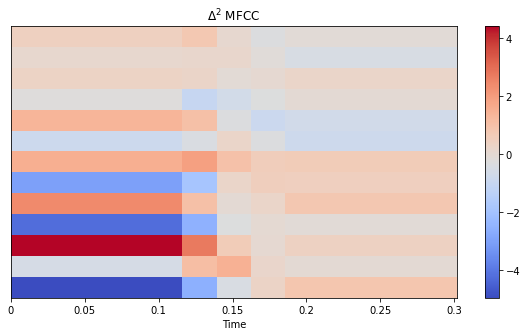

In [19]:
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

fig, ax = plt.subplots(figsize=(10,5))
img = librosa.display.specshow(delta2_mfcc, x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='$\Delta^2$ MFCC')
plt.show()